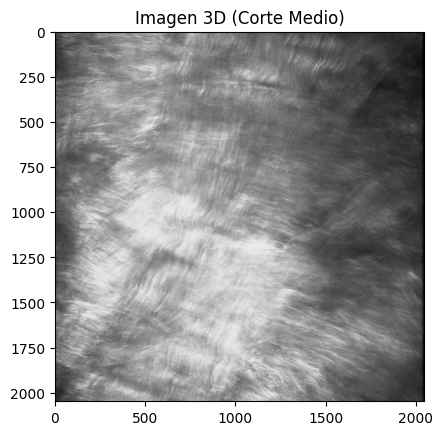

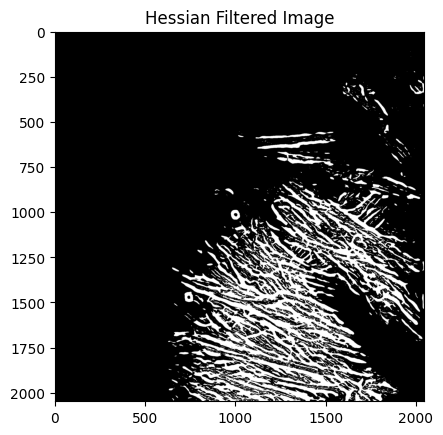

KeyboardInterrupt: 

In [ ]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage.filters import meijering, sato 
from skimage.morphology import skeletonize
from skimage.measure import regionprops, label
from scipy.spatial import distance, KDTree
from mpl_toolkits.mplot3d import Axes3D

# Función para cargar una imagen en escala de grises
def load_image(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise ValueError(f"No se pudo cargar la imagen: {image_path}")
    return img

# Función para combinar múltiples imágenes 2D en una imagen 3D
def stack_images_to_3d(folder_path):
    image_files = sorted([f for f in os.listdir(folder_path) if f.endswith('.png')])
    if not image_files:
        raise ValueError("No se encontraron imágenes en la carpeta")
    
    images = [load_image(os.path.join(folder_path, f)) for f in image_files]
    volume = np.stack(images, axis=-1)  # Apila las imágenes en la tercera dimensión
    return volume

# Directorio de imágenes
directory = "C:\\Users\\danwo\\Desktop\\ZS0001_TI_25XW_Rhodopsin_Au"

# Cargar imágenes en una imagen 3D
try:
    img_3d = stack_images_to_3d(directory)
except ValueError as e:
    print(e)
    img_3d = None

# Verificar carga de imágenes
if img_3d is None:
    print("No se encontraron imágenes en la carpeta especificada.")
else:
    plt.imshow(img_3d[:, :, img_3d.shape[2] // 2], cmap='gray')
    plt.title("Imagen 3D (Corte Medio)")
    plt.show()

    # Preprocesamiento y Segmentación
    processed_images = []
    skeletons = []
    for i in range(img_3d.shape[2]):
        img = img_3d[:, :, i]
        filtered = sato(img)  # Filtro basado en Hessian matrix
        filtered_uint8 = cv2.normalize(filtered, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)  # Convertir a uint8
        thresh = cv2.threshold(filtered_uint8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
        skeleton = skeletonize(thresh > 0)
        processed_images.append(thresh)
        skeletons.append(skeleton)
        
        plt.imshow(thresh, cmap='gray')
        plt.title(f"Imagen Procesada - capa {i}")
        plt.show()

    # Cálculo de Propiedades Geométricas
    lengths = []
    sinuosities = []
    densities = []

    for skeleton in skeletons:
        labeled = label(skeleton)
        props = regionprops(labeled)
        fiber_lengths = [prop.perimeter for prop in props]
        density = np.count_nonzero(skeleton) / np.prod(skeleton.shape)
        
        lengths.extend(fiber_lengths)
        densities.append(density)
        
        # Calcular sinuosidad (longitud real / distancia entre extremos)
        for prop in props:
            coords = prop.coords
            if len(coords) > 1:
                dist = distance.euclidean(coords[0], coords[-1])
                sinuosities.append(prop.perimeter / dist if dist != 0 else 1)
        
        print(f"Número de fibras detectadas: {len(props)}")

    # Análisis de Distribución de Fibras con KDTree
    def nearest_neighbor_distances(skeleton, sample_size=5000):
        coords = np.column_stack(np.where(skeleton))
        if coords.size == 0:
            return [0]
        
        # Tomar una muestra de puntos para reducir el cómputo
        if coords.shape[0] > sample_size:
            coords = coords[np.random.choice(coords.shape[0], sample_size, replace=False)]
        
        tree = KDTree(coords)
        dists, _ = tree.query(coords, k=2)  # Buscar el vecino más cercano
        return dists[:, 1]  # Ignorar la distancia a sí mismo

    clustering_values = [np.mean(nearest_neighbor_distances(skel)) for skel in skeletons]

    # Visualización de Resultados
    if lengths and sinuosities:
        fig, ax = plt.subplots(1, 2, figsize=(12, 5))
        ax[0].hist(lengths, bins=30, color='b', alpha=0.7)
        ax[0].set_title("Distribución de Longitudes de Fibras")
        ax[1].hist(sinuosities, bins=30, color='r', alpha=0.7)
        ax[1].set_title("Distribución de Sinuosidad")
        plt.show()
    else:
        print("No se encontraron fibras válidas para graficar.")

    # Visualización 3D de Fibras
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    for z, skel in enumerate(skeletons):
        coords = np.column_stack(np.where(skel))
        if coords.size > 0:
            ax.scatter(coords[:, 1], coords[:, 0], z, s=1)  # Usar coordenadas correctas para X, Y, Z
    ax.set_title("Representación 3D de Fibras")
    plt.show()

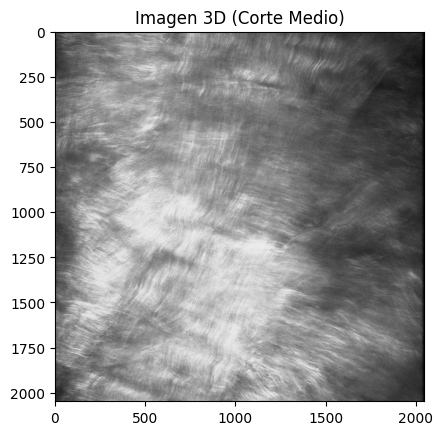

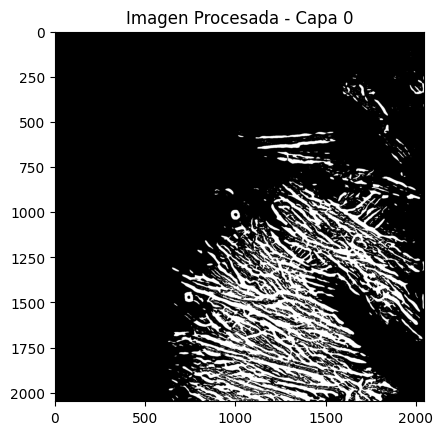

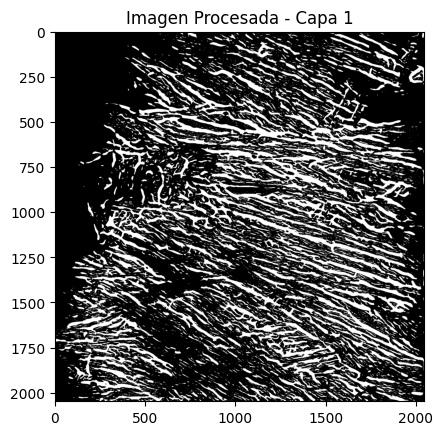

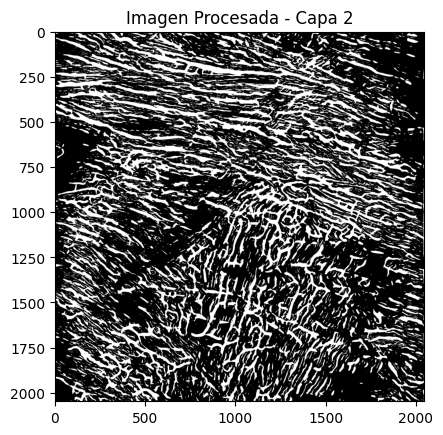

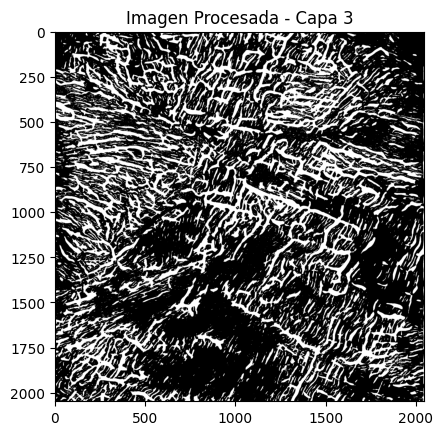

...

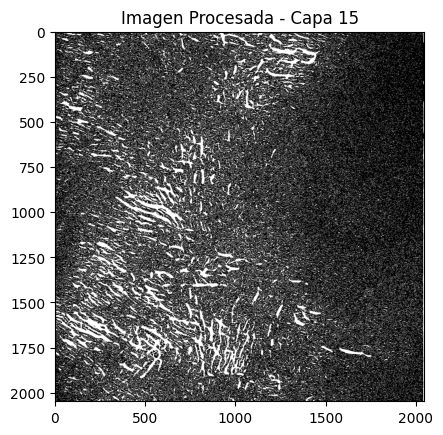

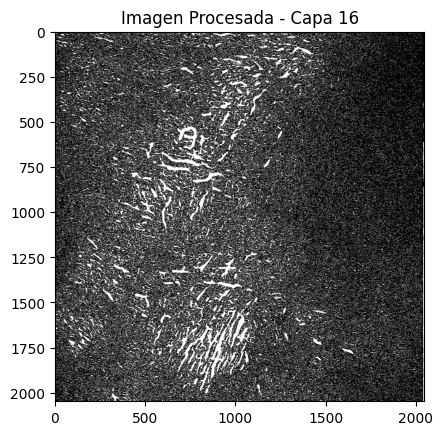

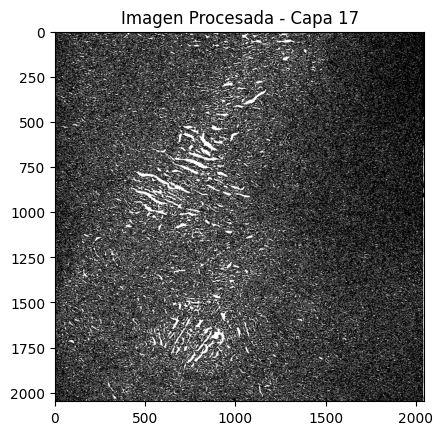

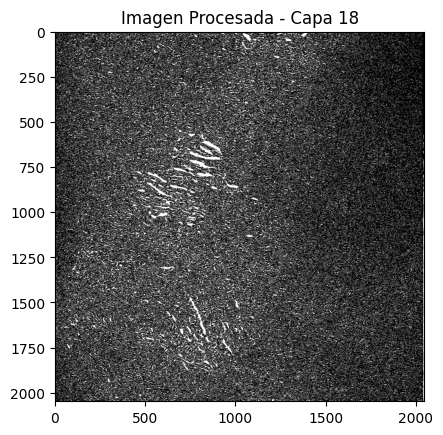

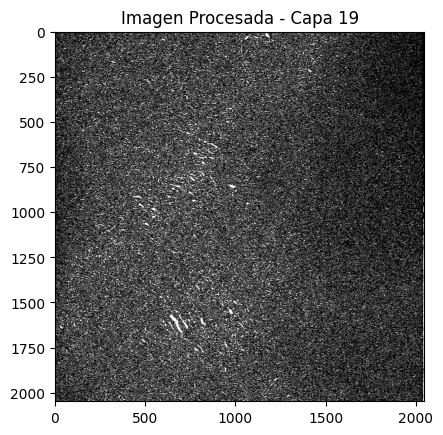

Número de fibras detectadas: 2648
Número de fibras detectadas: 9755
Número de fibras detectadas: 9482
Número de fibras detectadas: 8171
Número de fibras detectadas: 9220
Número de fibras detectadas: 11518
Número de fibras detectadas: 14564
Número de fibras detectadas: 14743
Número de fibras detectadas: 17292
Número de fibras detectadas: 25289
Número de fibras detectadas: 33274
Número de fibras detectadas: 38901
Número de fibras detectadas: 46423
Número de fibras detectadas: 52427
Número de fibras detectadas: 57349
Número de fibras detectadas: 61353
Número de fibras detectadas: 64007
Número de fibras detectadas: 64595
Número de fibras detectadas: 66501
Número de fibras detectadas: 66598


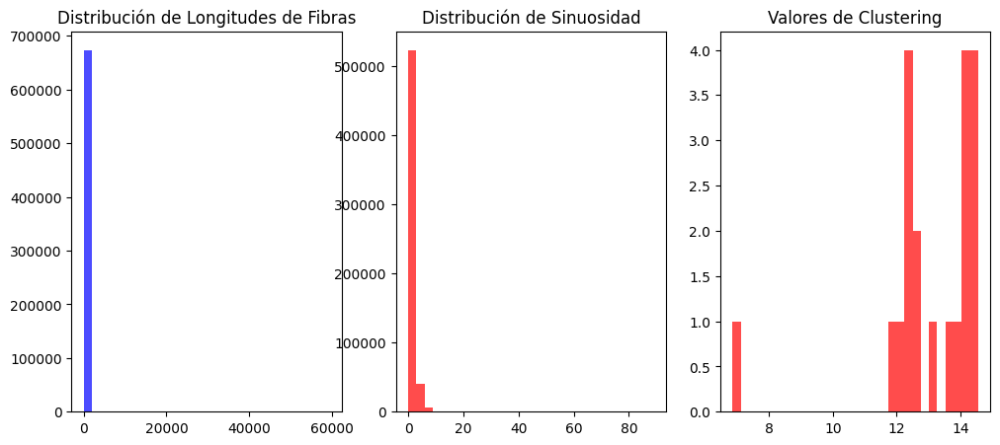

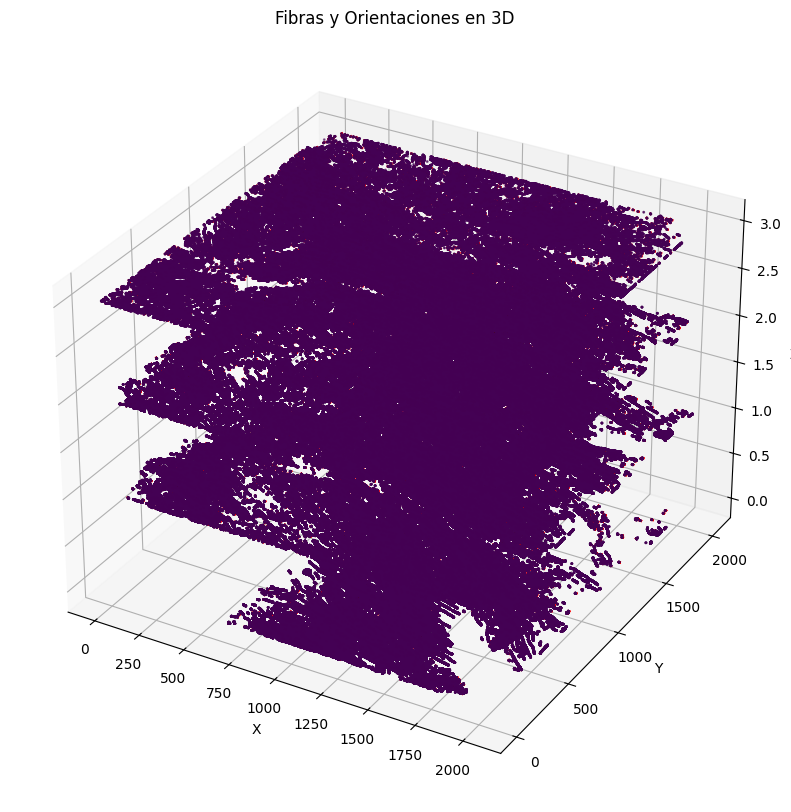

In [ ]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage.filters import meijering, sato
from skimage.morphology import skeletonize
from skimage.measure import regionprops, label
from scipy.spatial import distance, KDTree
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import colors

# Función para cargar una imagen en escala de grises
def load_image(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise ValueError(f"No se pudo cargar la imagen: {image_path}")
    return img

# Función para combinar múltiples imágenes 2D en una imagen 3D
def stack_images_to_3d(folder_path):
    image_files = sorted([f for f in os.listdir(folder_path) if f.endswith('.png')])
    if not image_files:
        raise ValueError("No se encontraron imágenes en la carpeta")
    
    images = [load_image(os.path.join(folder_path, f)) for f in image_files]
    volume = np.stack(images, axis=-1)  # Apila las imágenes en la tercera dimensión
    return volume


def compute_fiber_orientation(skeleton):
    """
    Calcula las orientaciones principales de las fibras en el esqueleto.
    """
    labeled = label(skeleton)
    props = regionprops(labeled)
    orientations = []
    for prop in props:
        coords = prop.coords
        if len(coords) > 1:  # Si hay suficientes puntos para definir una orientación
            vector = coords[-1] - coords[0]  # Vector entre los extremos
            orientation = vector / np.linalg.norm(vector)  # Vector normalizado
            orientations.append((coords[0], orientation))
    return orientations


# Directorio de imágenes
directory = "C:\\Users\\danwo\\Desktop\\ZS0001_TI_25XW_Rhodopsin_Au"

# Cargar imágenes en una imagen 3D
try:
    img_3d = stack_images_to_3d(directory)
except ValueError as e:
    print(e)
    img_3d = None

# Verificar carga de imágenes
if img_3d is None:
    print("No se encontraron imágenes en la carpeta especificada.")
else:
    plt.imshow(img_3d[:, :, img_3d.shape[2] // 2], cmap='gray')
    plt.title("Imagen 3D (Corte Medio)")
    plt.show()

    # Preprocesamiento y Segmentación
    processed_images = []
    skeletons = []
    for i in range(img_3d.shape[2]):
        img = img_3d[:, :, i]
        filtered = sato(img)  # Filtro basado en Hessian matrix
        filtered_uint8 = cv2.normalize(filtered, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)  # Convertir a uint8
        thresh = cv2.threshold(filtered_uint8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
        skeleton = skeletonize(thresh > 0)
        processed_images.append(thresh)
        skeletons.append(skeleton)
        
        plt.imshow(thresh, cmap='gray')
        plt.title(f"Imagen Procesada - capa {i}")
        plt.show()

    # Cálculo de Propiedades Geométricas
    lengths = []
    sinuosities = []
    densities = []

    for skeleton in skeletons:
        labeled = label(skeleton)
        props = regionprops(labeled)
        fiber_lengths = [prop.perimeter for prop in props]
        density = np.count_nonzero(skeleton) / np.prod(skeleton.shape)
        
        lengths.extend(fiber_lengths)
        densities.append(density)
        
        # Calcular sinuosidad (longitud real / distancia entre extremos)
        for prop in props:
            coords = prop.coords
            if len(coords) > 1:
                dist = distance.euclidean(coords[0], coords[-1])
                sinuosities.append(prop.perimeter / dist if dist != 0 else 1)
        
        print(f"Número de fibras detectadas: {len(props)}")

    # Análisis de Distribución de Fibras con KDTree
    def nearest_neighbor_distances(skeleton, sample_size=5000):
        coords = np.column_stack(np.where(skeleton))
        if coords.size == 0:
            return [0]
        
        # Tomar una muestra de puntos para reducir el cómputo
        if coords.shape[0] > sample_size:
            coords = coords[np.random.choice(coords.shape[0], sample_size, replace=False)]
        
        tree = KDTree(coords)
        dists, _ = tree.query(coords, k=2)  # Buscar el vecino más cercano
        return dists[:, 1]  # Ignorar la distancia a sí mismo

    clustering_values = [np.mean(nearest_neighbor_distances(skel)) for skel in skeletons]

    # Visualización de Resultados
    if lengths and sinuosities:
        fig, ax = plt.subplots(1, 3, figsize=(12, 5))
        ax[0].hist(lengths, bins=30, color='b', alpha=0.7)
        ax[0].set_title("Distribución de Longitudes de Fibras")
        ax[1].hist(sinuosities, bins=30, color='r', alpha=0.7)
        ax[1].set_title("Distribución de Sinuosidad")
        ax[2].hist(clustering_values, bins=30, color='r', alpha=0.7)
        ax[2].set_title("Valores de Clustering")
        plt.show()
    else:
        print("No se encontraron fibras válidas para graficar.")

    # Representación de fibras con orientación en 3D
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')

    for z, skele in enumerate(skeletons):
        #Vamos a coger la mitad de las imagenes para que tarde menos y porque las ultimas no aportan nada
        z=int(z/6)
        skel = skeletons[z]        
        # Las invertimos para que se vean primero las capas más cercanas
        skel= skel[::-1] 

        coords = np.column_stack(np.where(skel))
        if coords.size > 0:
            # Cambia el color o tamaño en función de la capa
            norm = colors.Normalize(vmin=0, vmax=len(skel) * 1.5)  # Ajustar el rango para mayor contraste
            color = plt.cm.viridis(norm(z))
            ax.scatter(coords[:, 1], coords[:, 0], z, c=[color], s=1) 

        # Calcular orientaciones
        orientations = compute_fiber_orientation(skel)
        for start, vector in orientations:
            start = np.array([start[1], start[0], z])  # Convertir coordenadas para 3D
            # Asegurar que el vector sea tridimensional
            vector = np.array([vector[1], vector[0], 0])  # Suponer 0 en Z si es un vector 2D
            end = start + vector * 5  # Escalar el vector para visualizar
            ax.plot([start[0], end[0]], [start[1], end[1]], [start[2], end[2]], color='red')  # Orientación en rojo

    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_zlabel("Z")
    ax.set_title("Fibras y Orientaciones en 3D")
    plt.show()


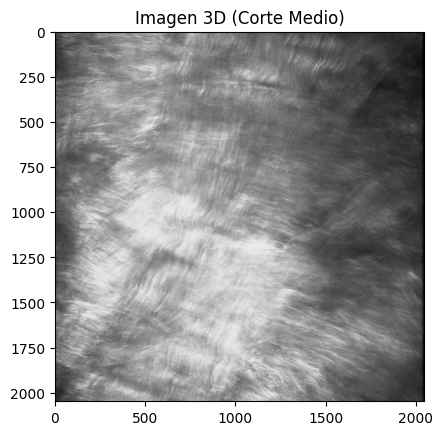

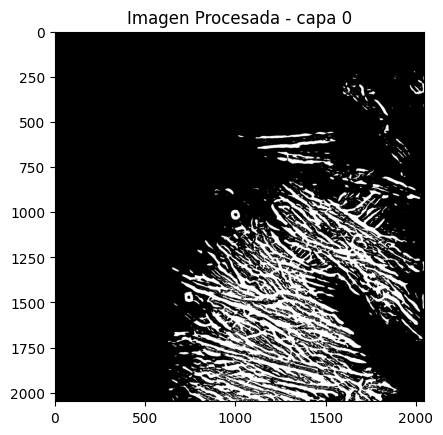

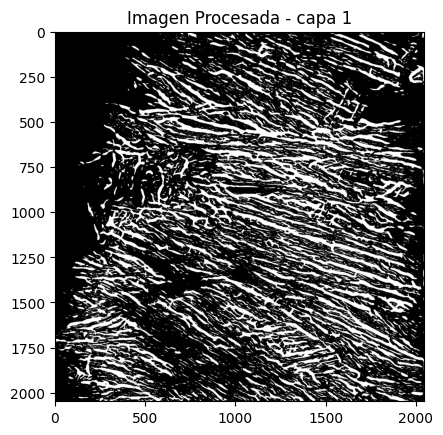

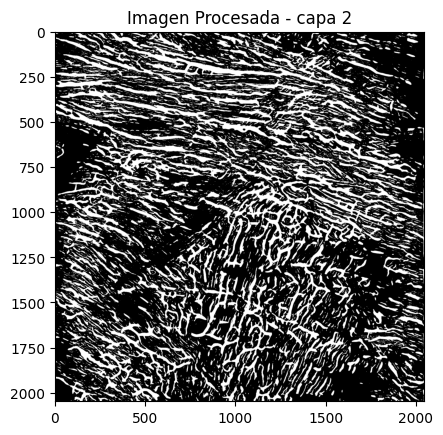

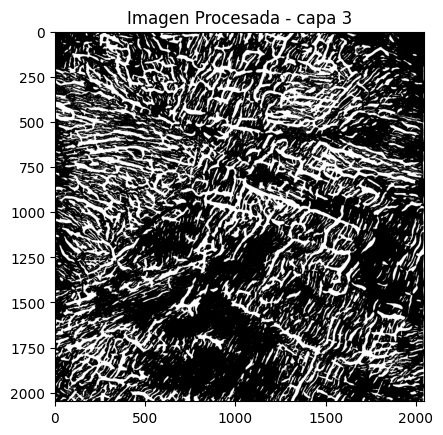

...

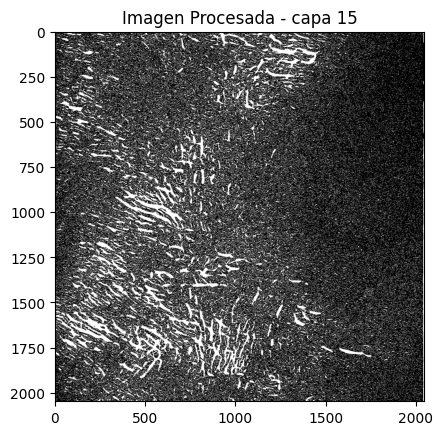

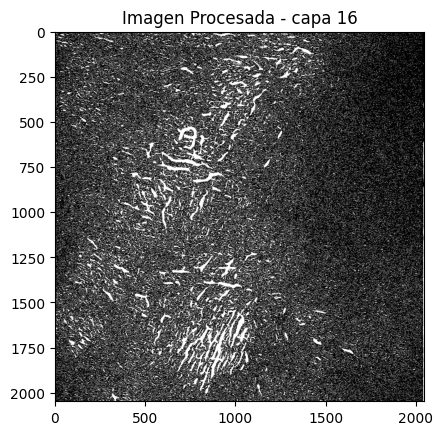

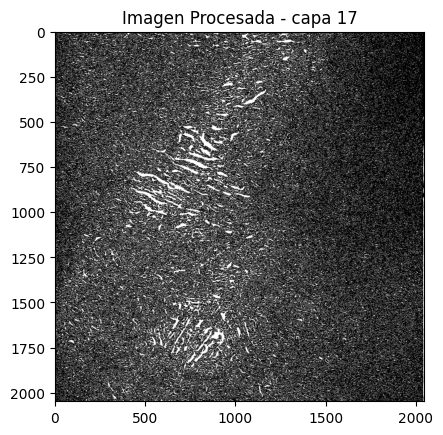

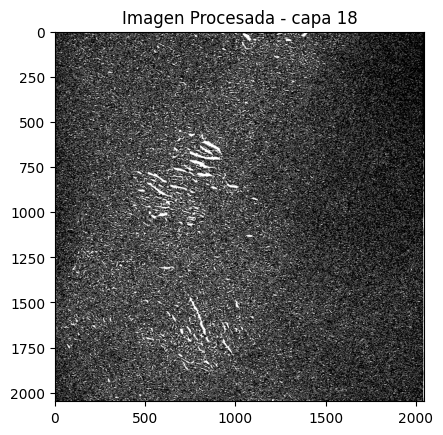

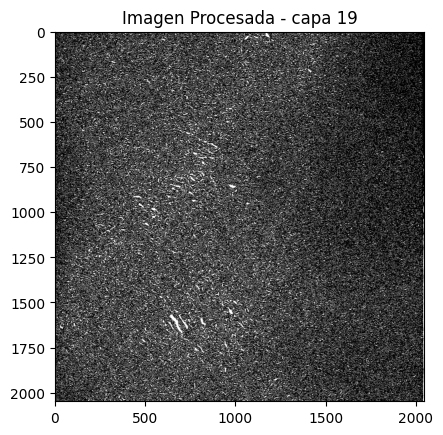

Número de fibras detectadas: 2648
Número de fibras detectadas: 9755
Número de fibras detectadas: 9482
Número de fibras detectadas: 8171
Número de fibras detectadas: 9220
Número de fibras detectadas: 11518
Número de fibras detectadas: 14564
Número de fibras detectadas: 14743
Número de fibras detectadas: 17292
Número de fibras detectadas: 25289
Número de fibras detectadas: 33274
Número de fibras detectadas: 38901
Número de fibras detectadas: 46423
Número de fibras detectadas: 52427
Número de fibras detectadas: 57349
Número de fibras detectadas: 61353
Número de fibras detectadas: 64007
Número de fibras detectadas: 64595
Número de fibras detectadas: 66501
Número de fibras detectadas: 66598


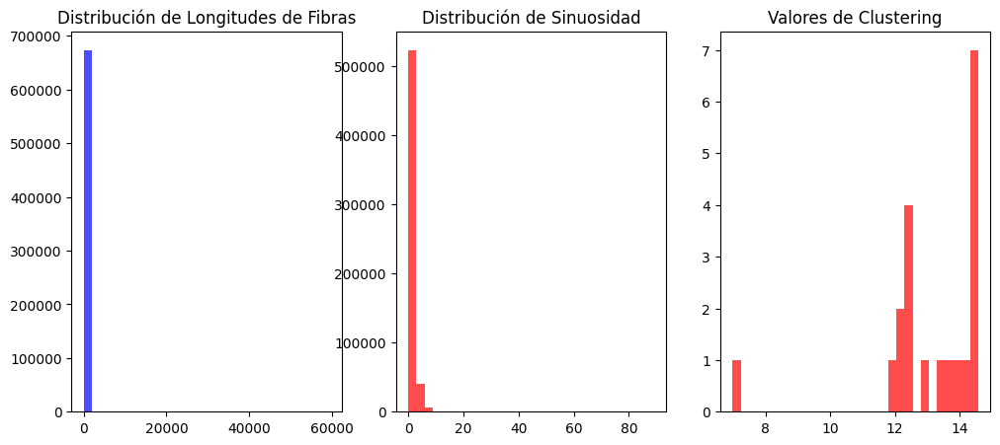

AttributeError: 'int' object has no attribute 'min'

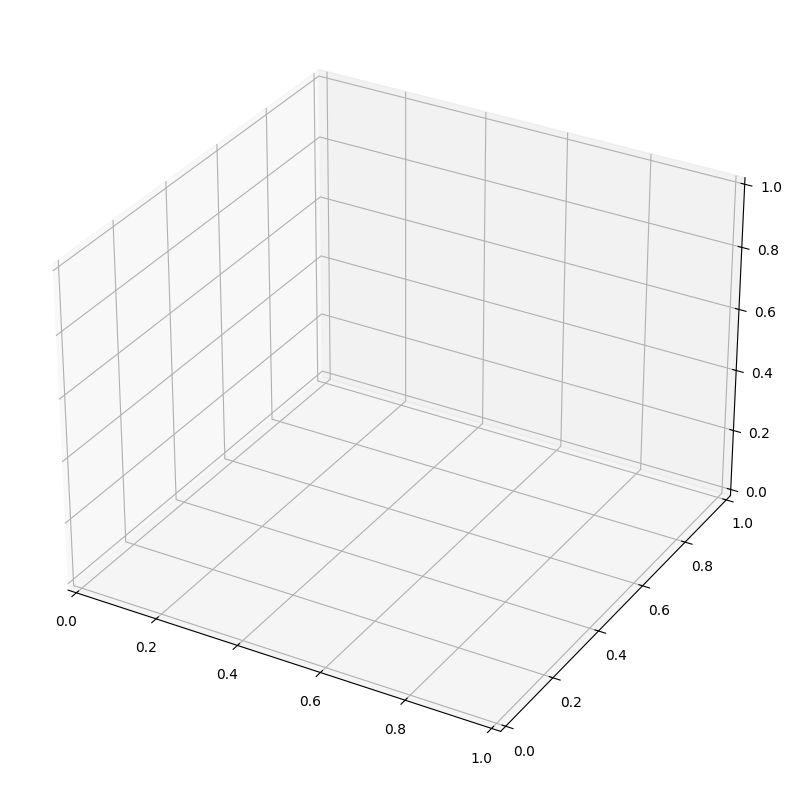

In [1]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage.filters import meijering, sato
from skimage.morphology import skeletonize
from skimage.measure import regionprops, label
from scipy.spatial import distance, KDTree
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import colors

# Función para cargar una imagen en escala de grises
def load_image(image_path):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise ValueError(f"No se pudo cargar la imagen: {image_path}")
    return img

# Función para combinar múltiples imágenes 2D en una imagen 3D
def stack_images_to_3d(folder_path):
    image_files = sorted([f for f in os.listdir(folder_path) if f.endswith('.png')])
    if not image_files:
        raise ValueError("No se encontraron imágenes en la carpeta")
    
    images = [load_image(os.path.join(folder_path, f)) for f in image_files]
    volume = np.stack(images, axis=-1)  # Apila las imágenes en la tercera dimensión
    return volume


def compute_fiber_orientation(skeleton):
    """
    Calcula las orientaciones principales de las fibras en el esqueleto.
    """
    labeled = label(skeleton)
    props = regionprops(labeled)
    orientations = []
    for prop in props:
        coords = prop.coords
        if len(coords) > 1:  # Si hay suficientes puntos para definir una orientación
            vector = coords[-1] - coords[0]  # Vector entre los extremos
            orientation = vector / np.linalg.norm(vector)  # Vector normalizado
            orientations.append((coords[0], orientation))
    return orientations


# Directorio de imágenes
directory = "C:\\Users\\danwo\\Desktop\\ZS0001_TI_25XW_Rhodopsin_Au"

# Cargar imágenes en una imagen 3D
try:
    img_3d = stack_images_to_3d(directory)
except ValueError as e:
    print(e)
    img_3d = None

# Verificar carga de imágenes
if img_3d is None:
    print("No se encontraron imágenes en la carpeta especificada.")
else:
    plt.imshow(img_3d[:, :, img_3d.shape[2] // 2], cmap='gray')
    plt.title("Imagen 3D (Corte Medio)")
    plt.show()

    # Preprocesamiento y Segmentación
    processed_images = []
    skeletons = []
    for i in range(img_3d.shape[2]):
        img = img_3d[:, :, i]
        filtered = sato(img)  # Filtro basado en Hessian matrix
        filtered_uint8 = cv2.normalize(filtered, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)  # Convertir a uint8
        thresh = cv2.threshold(filtered_uint8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]
        skeleton = skeletonize(thresh > 0)
        processed_images.append(thresh)
        skeletons.append(skeleton)
        
        plt.imshow(thresh, cmap='gray')
        plt.title(f"Imagen Procesada - capa {i}")
        plt.show()

    # Cálculo de Propiedades Geométricas
    lengths = []
    sinuosities = []
    densities = []

    for skeleton in skeletons:
        labeled = label(skeleton)
        props = regionprops(labeled)
        fiber_lengths = [prop.perimeter for prop in props]
        density = np.count_nonzero(skeleton) / np.prod(skeleton.shape)
        
        lengths.extend(fiber_lengths)
        densities.append(density)
        
        # Calcular sinuosidad (longitud real / distancia entre extremos)
        for prop in props:
            coords = prop.coords
            if len(coords) > 1:
                dist = distance.euclidean(coords[0], coords[-1])
                sinuosities.append(prop.perimeter / dist if dist != 0 else 1)
        
        print(f"Número de fibras detectadas: {len(props)}")

    # Análisis de Distribución de Fibras con KDTree
    def nearest_neighbor_distances(skeleton, sample_size=5000):
        coords = np.column_stack(np.where(skeleton))
        if coords.size == 0:
            return [0]
        
        # Tomar una muestra de puntos para reducir el cómputo
        if coords.shape[0] > sample_size:
            coords = coords[np.random.choice(coords.shape[0], sample_size, replace=False)]
        
        tree = KDTree(coords)
        dists, _ = tree.query(coords, k=2)  # Buscar el vecino más cercano
        return dists[:, 1]  # Ignorar la distancia a sí mismo

    clustering_values = [np.mean(nearest_neighbor_distances(skel)) for skel in skeletons]

    # Visualización de Resultados
    if lengths and sinuosities:
        fig, ax = plt.subplots(1, 3, figsize=(12, 5))
        ax[0].hist(lengths, bins=30, color='b', alpha=0.7)
        ax[0].set_title("Distribución de Longitudes de Fibras")
        ax[1].hist(sinuosities, bins=30, color='r', alpha=0.7)
        ax[1].set_title("Distribución de Sinuosidad")
        ax[2].hist(clustering_values, bins=30, color='r', alpha=0.7)
        ax[2].set_title("Valores de Clustering")
        plt.show()
    else:
        print("No se encontraron fibras válidas para graficar.")

    # Representación de fibras con orientación en 3D
    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')

    for z, skele in enumerate(skeletons):
        #Vamos a coger la mitad de las imagenes para que tarde menos y porque las ultimas no aportan nada
        z=int(z/6)
        skel = skeletons[z]        
        # Las invertimos para que se vean primero las capas más cercanas
        skel= skel[::-1] 

        coords = np.column_stack(np.where(skel))
        if coords.size > 0:
            # Cambia el color o tamaño en función de la capa
           # Color según el fotograma (z), usando un colormap
            norm = plt.Normalize(z.min(), z.max())
            colors = plt.cm.viridis(norm(z))
            ax.scatter(coords[:, 1], coords[:, 0], z, c=[color], s=1) 

        # Calcular orientaciones
        orientations = compute_fiber_orientation(skel)
        for start, vector in orientations:
            start = np.array([start[1], start[0], z])  # Convertir coordenadas para 3D
            # Asegurar que el vector sea tridimensional
            vector = np.array([vector[1], vector[0], 0])  # Suponer 0 en Z si es un vector 2D
            end = start + vector * 5  # Escalar el vector para visualizar
            ax.plot([start[0], end[0]], [start[1], end[1]], [start[2], end[2]], color='red')  # Orientación en rojo

    # --- Invertir el eje Z para que el fotograma 0 esté arriba ---
    ax.invert_zaxis()  # ¡Esta es la línea clave!
    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_zlabel("Z")
    ax.set_title("Fibras y Orientaciones en 3D")
    plt.show()
